In [1]:
from gluonts.dataset.repository import get_dataset
from gluonts.dataset.multivariate_grouper import MultivariateGrouper

import matplotlib.pyplot as plt

import os
import pickle

# Preparation

Initialize some folders and filenames

In [2]:
folder = '../MULTIVARIATE_GLUON_RESULTS_GAS'
dataset_name = 'nn5_weekly'
dataset_folder = os.path.join(folder, dataset_name)

normalizer_name = 'gas_complex_gaussian'
normalizer_folder = os.path.join(dataset_folder, normalizer_name)
init_params_norm_filename = os.path.join(normalizer_folder, 'init_params.json')
###
means_folder = os.path.join(normalizer_folder, 'means')
test_means_folder = os.path.join(means_folder, 'test')
vars_folder = os.path.join(normalizer_folder, 'vars')
test_vars_folder = os.path.join(vars_folder, 'test')
norm_ts_folder = os.path.join(normalizer_folder, 'normalized_ts')
test_norm_ts_folder = os.path.join(norm_ts_folder, 'test')

mean_layer_name = 'linear'
mean_layer_folder = os.path.join(dataset_folder, mean_layer_name)
init_params_mean_layer_filename = os.path.join(mean_layer_folder, 'init_params.json')
mean_layer_filename = os.path.join(mean_layer_folder, 'mean_layer.pkl')
mean_layer_res_filename = os.path.join(mean_layer_folder, 'results.txt')
###
test_means_predictions_folder = os.path.join(mean_layer_folder, 'test_mean_layer_preds')

Get computed values

In [3]:
test_means = []
for i in range(len(os.listdir(test_means_folder))):
    with open(os.path.join(test_means_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_means.append(pickle.load(f))

len(test_means), type(test_means[0]), test_means[0].shape

(1, numpy.ndarray, (113, 111))

each feature of the computed means correspond to a univariate time series in the original dataset 

In [4]:
test_vars = []
for i in range(len(os.listdir(test_vars_folder))):
    with open(os.path.join(test_vars_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_vars.append(pickle.load(f))
        
len(test_vars), type(test_vars[0]), test_vars[0].shape

(1, numpy.ndarray, (113, 111))

In [5]:
test_norm_ts = []
for i in range(len(os.listdir(test_norm_ts_folder))):
    with open(os.path.join(test_norm_ts_folder, f'ts_{i}.pkl'), 'rb') as f:
        test_norm_ts.append(pickle.load(f))

len(test_norm_ts), type(test_norm_ts[0]), test_norm_ts[0].shape

(1, numpy.ndarray, (113, 111))

In [6]:
predictions = []
for i in range(len(os.listdir(test_means_predictions_folder))):
    with open(os.path.join(test_means_predictions_folder, f'ts_{i}.pkl'), 'rb') as f:
        predictions.append(pickle.load(f))

len(predictions), type(predictions[0]), predictions[0].shape

(1, numpy.ndarray, (113, 111))

In [7]:
predictions = predictions[0].T
norm_ts = test_norm_ts[0].T
means = test_means[0].T
vars = test_vars[0].T

predictions.shape, norm_ts.shape, means.shape, vars.shape

((111, 113), (111, 113), (111, 113), (111, 113))

Get the multivariate dataset

In [8]:
n_features = predictions.shape[0]

dataset = get_dataset(dataset_name)
test_grouper = MultivariateGrouper(
                max_target_dim=n_features,
                num_test_dates=len(dataset.test) // n_features,
            )
test_dataset = test_grouper(dataset.test)

test_dataset = test_dataset[0]["target"]

len(test_dataset), type(test_dataset[0]), test_dataset.shape

(111, numpy.ndarray, (111, 113))

# Plot a ts with the values computed by mean layer and normalizer

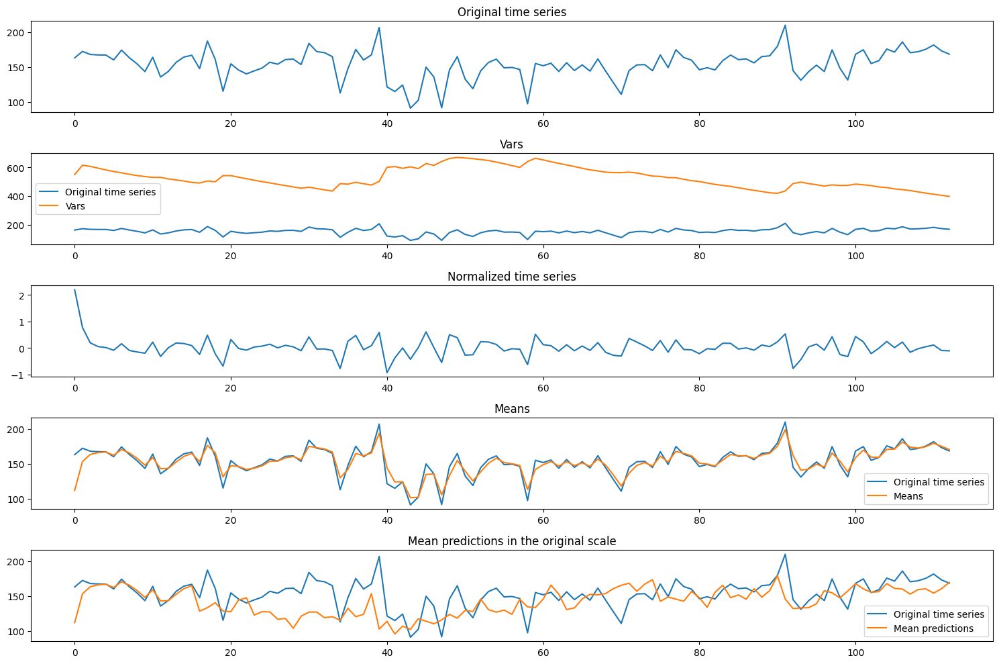

In [9]:
ts_index = 15

# create a subfigure with 5 plots in each: 
# - the original time series, 
# - the normalized time series, 
# - the original time series with its means,
# - the original time series with its vars,
# - the original time series with the predictions

fig, axs = plt.subplots(5, 1, figsize=(15, 10))
axs[0].plot(test_dataset[ts_index])
axs[0].set_title('Original time series')

axs[1].plot(test_dataset[ts_index])
axs[1].plot(vars[ts_index])
axs[1].set_title('Vars')
axs[1].legend(['Original time series', 'Vars'])

axs[2].plot(norm_ts[ts_index])
axs[2].set_title('Normalized time series')

axs[3].plot(test_dataset[ts_index])
axs[3].plot(means[ts_index])
axs[3].set_title('Means')
axs[3].legend(['Original time series', 'Means'])

axs[4].plot(test_dataset[ts_index])
axs[4].plot(predictions[ts_index])
axs[4].set_title('Mean predictions in the original scale')
axs[4].legend(['Original time series', 'Mean predictions'])

plt.tight_layout()
plt.show()

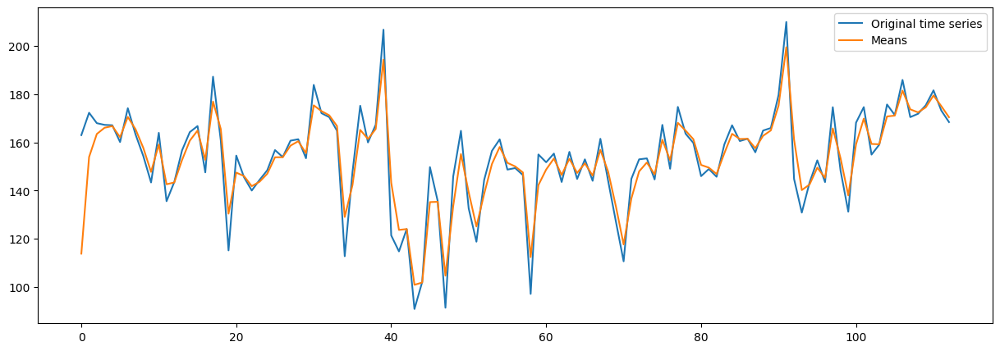

In [10]:
plt.figure(figsize=(15, 5))
plt.plot(test_dataset[ts_index])
plt.plot(norm_ts[ts_index] + means[ts_index])
plt.legend(['Original time series', 'Means'])
plt.show()

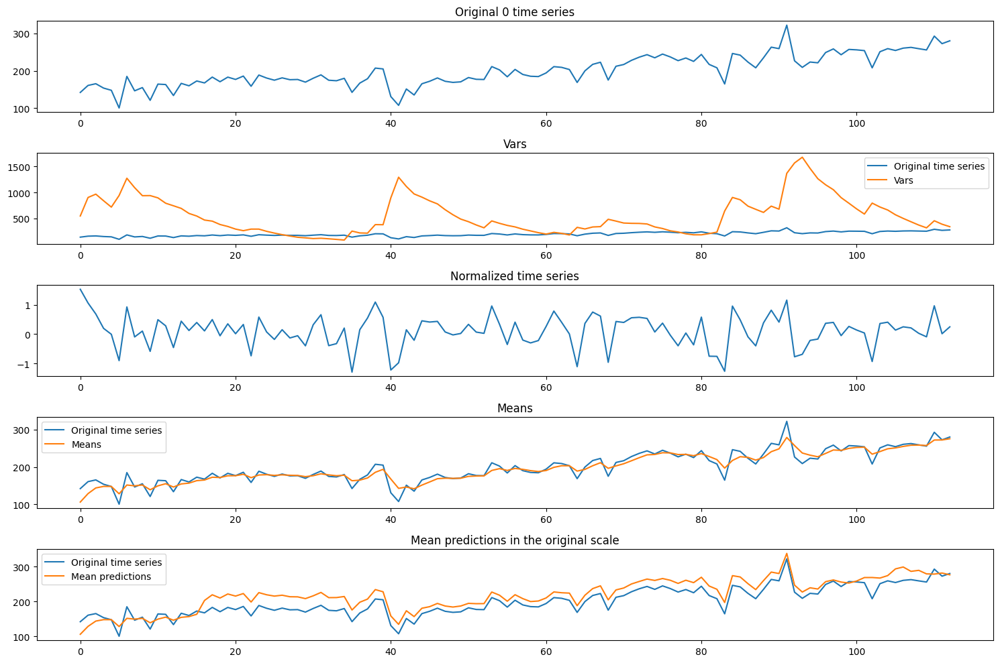

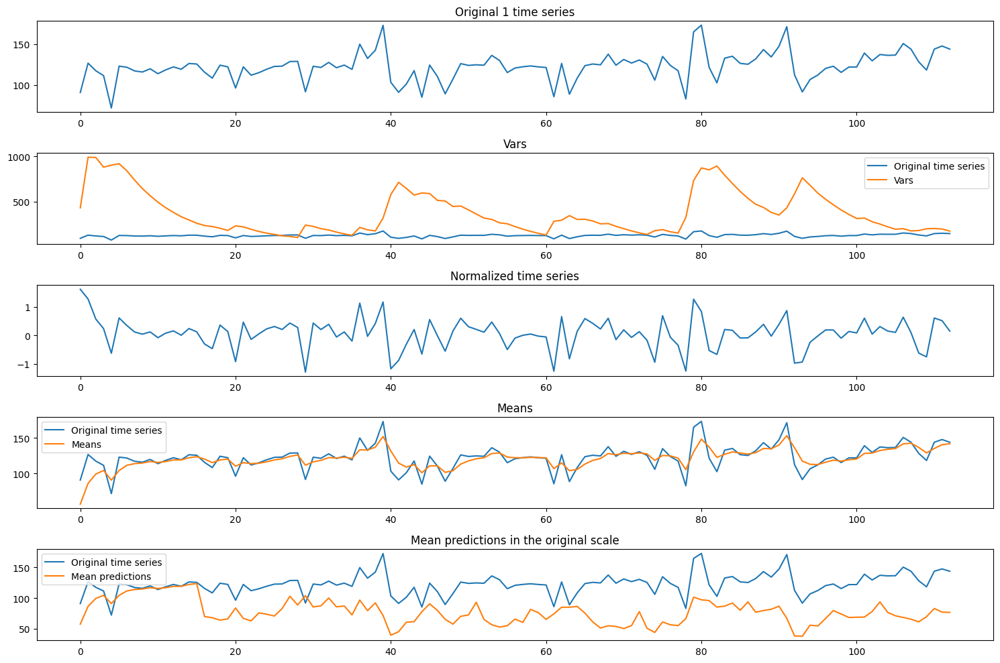

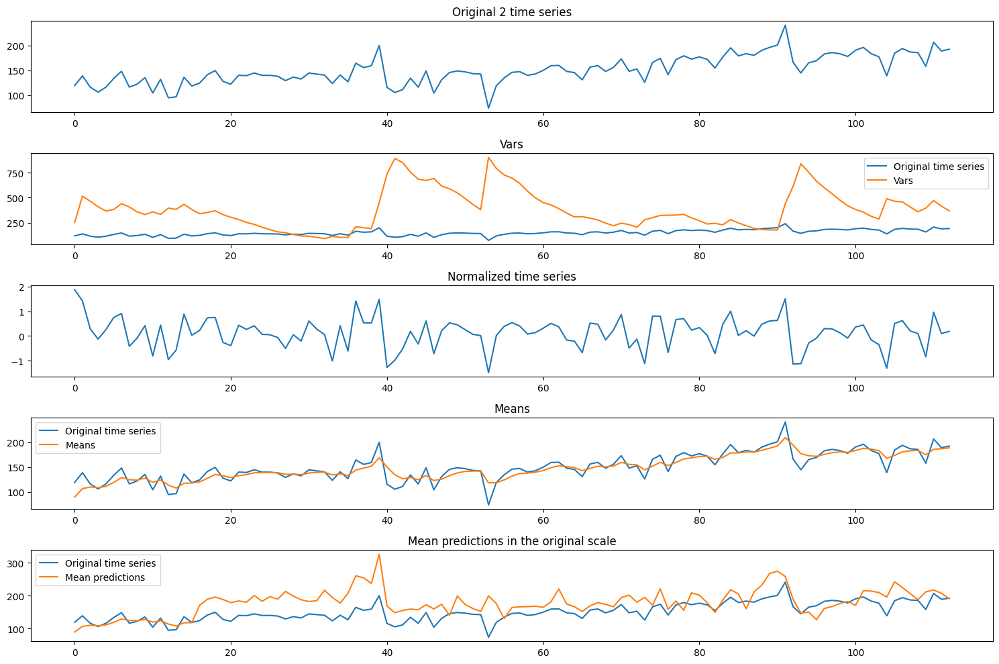

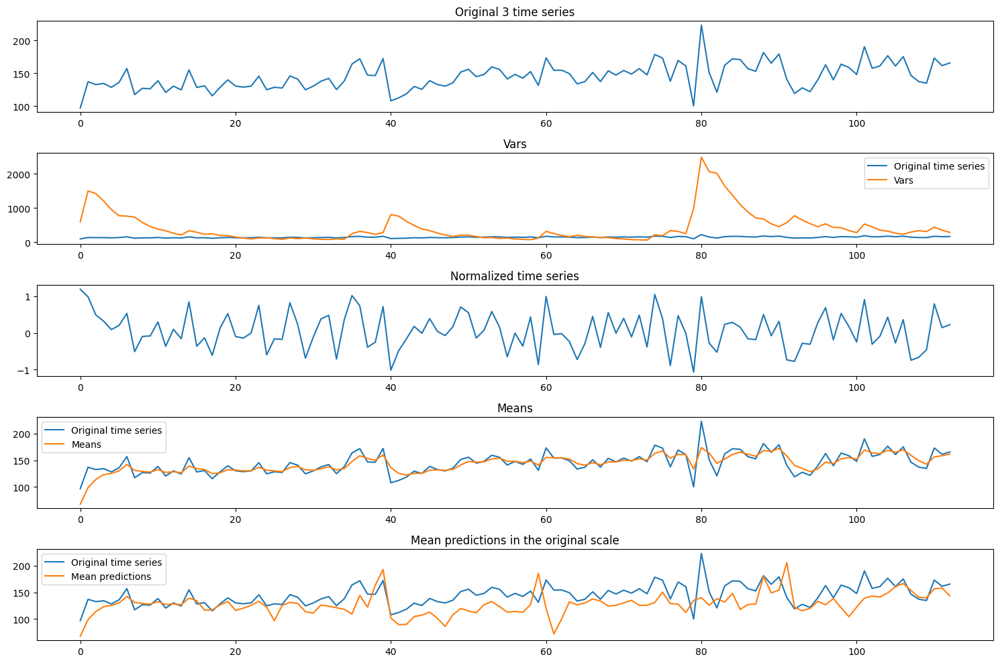

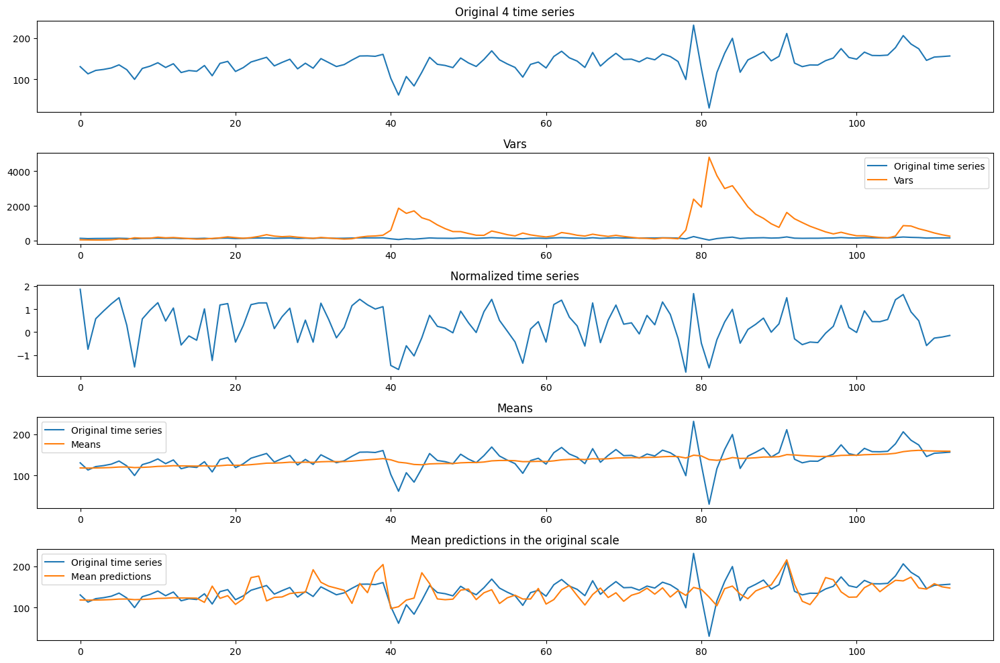

...

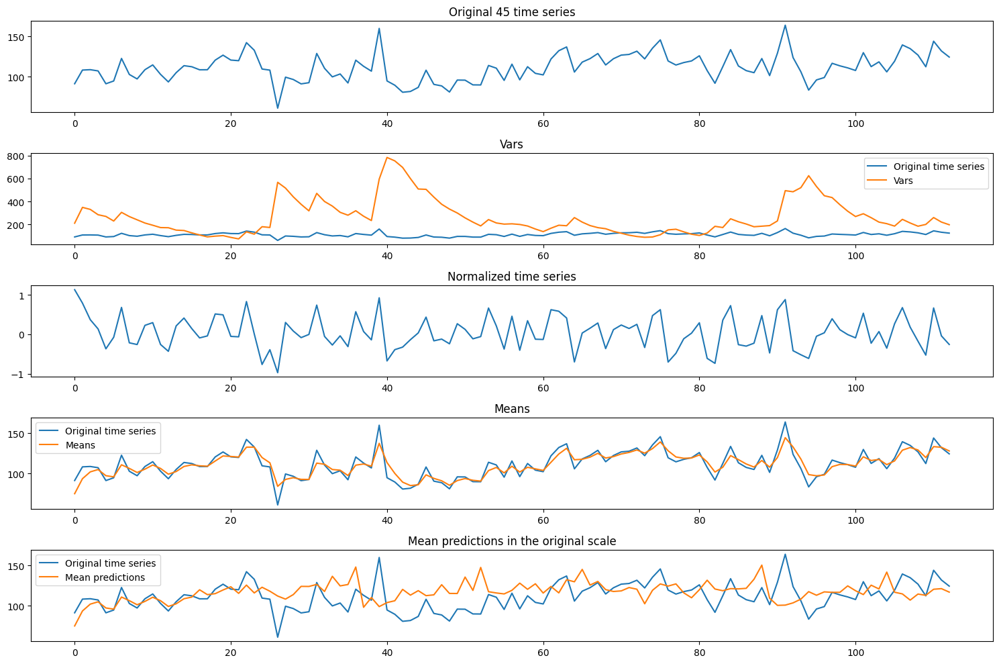

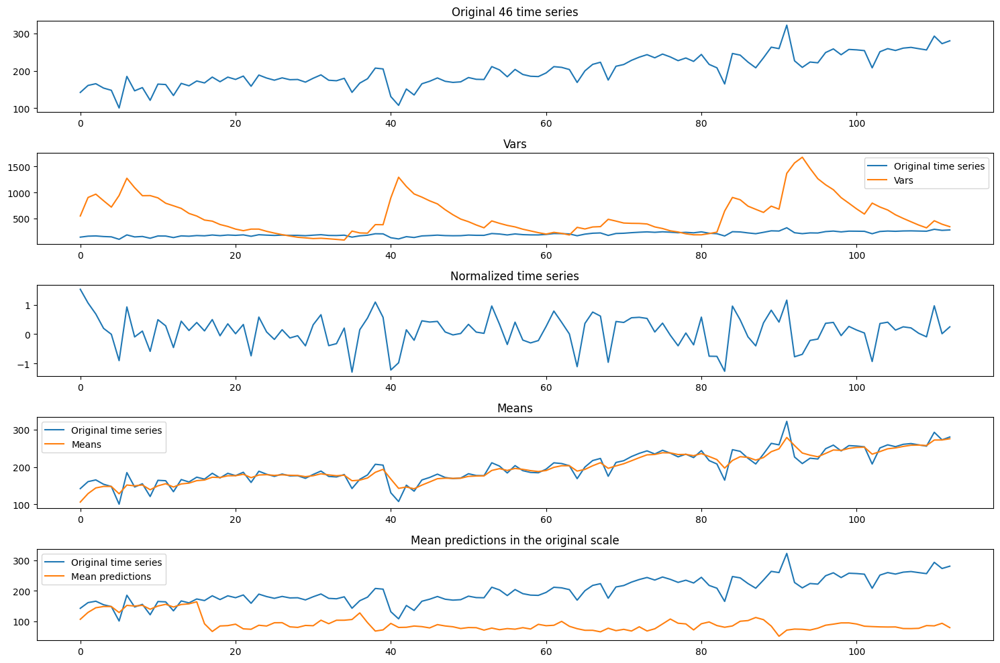

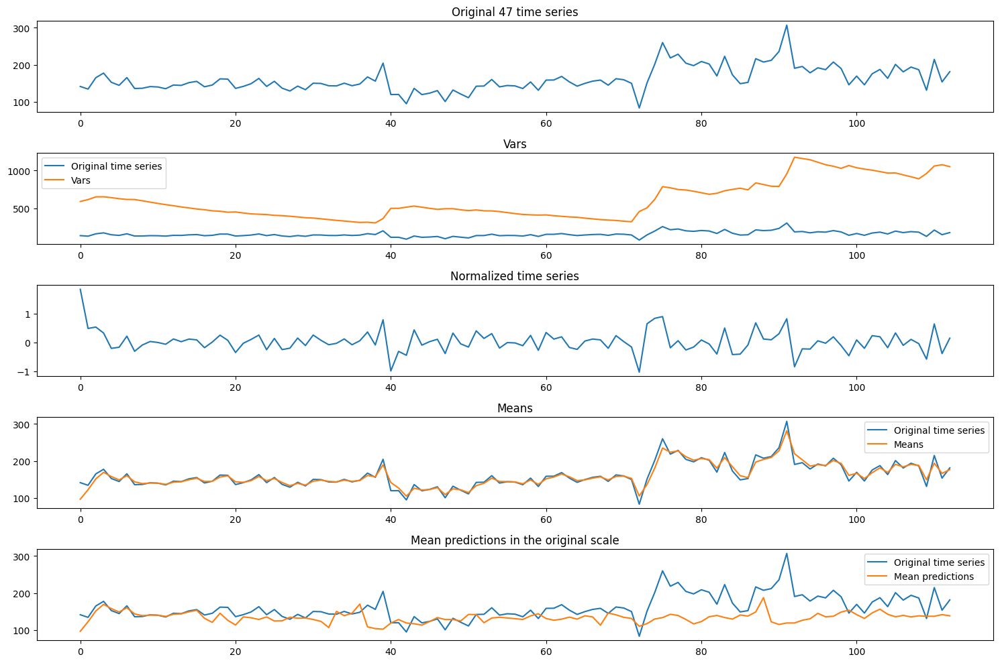

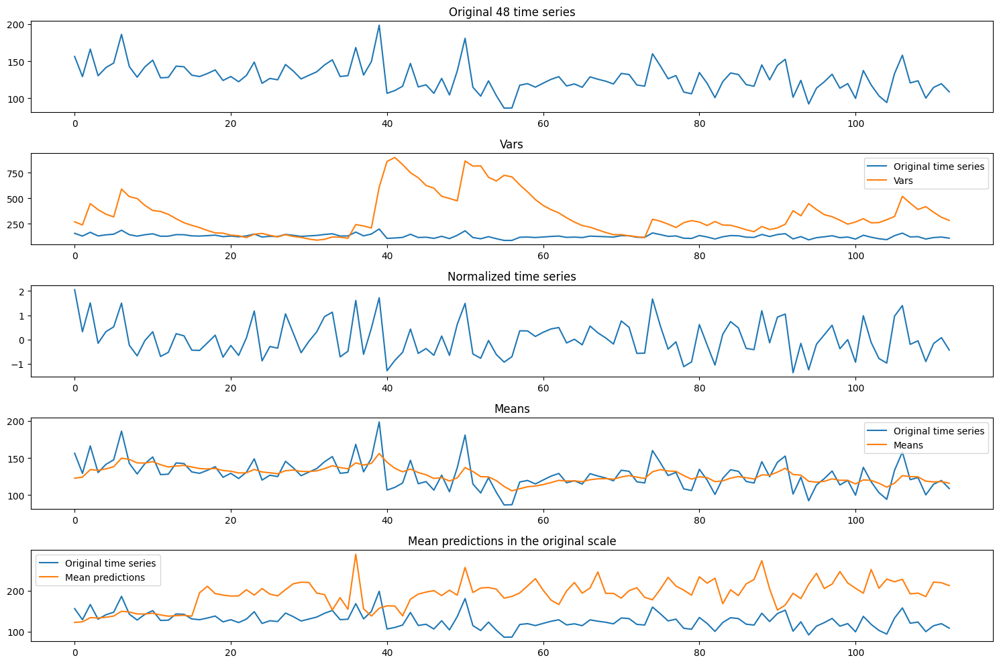

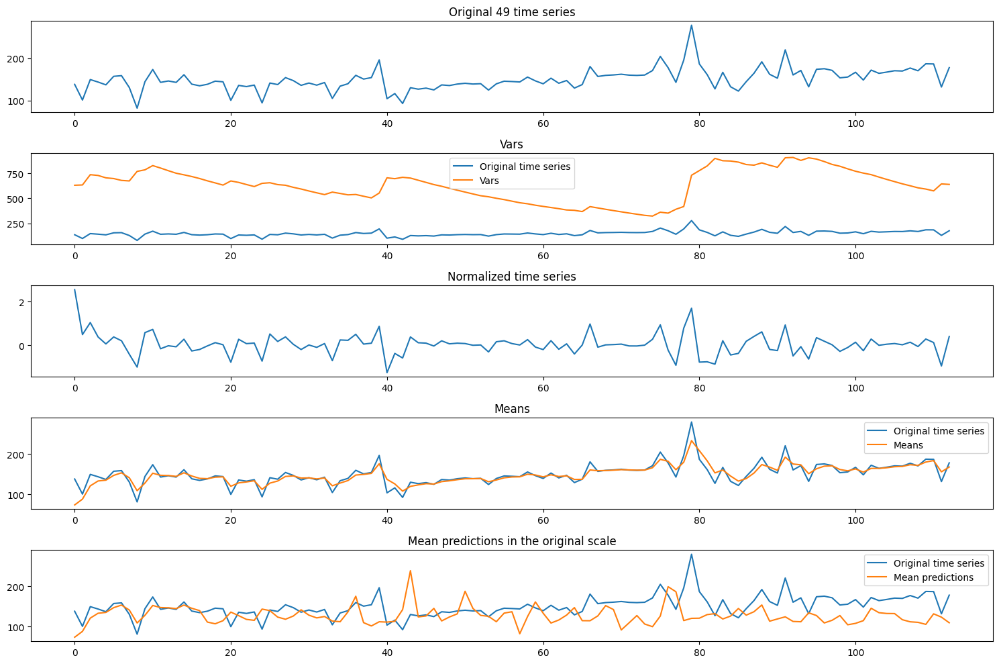

In [11]:
for ts_index in range(50):

    # create a subfigure with 5 plots in each: 
    # - the original time series, 
    # - the normalized time series, 
    # - the original time series with its means,
    # - the original time series with its vars,
    # - the original time series with the predictions

    fig, axs = plt.subplots(5, 1, figsize=(15, 10))
    axs[0].plot(test_dataset[ts_index])
    axs[0].set_title(f'Original {ts_index} time series')

    axs[1].plot(test_dataset[ts_index])
    axs[1].plot(vars[ts_index])
    axs[1].set_title('Vars')
    axs[1].legend(['Original time series', 'Vars'])

    axs[2].plot(norm_ts[ts_index])
    axs[2].set_title('Normalized time series')

    axs[3].plot(test_dataset[ts_index])
    axs[3].plot(means[ts_index])
    axs[3].set_title('Means')
    axs[3].legend(['Original time series', 'Means'])

    axs[4].plot(test_dataset[ts_index])
    axs[4].plot(predictions[ts_index])
    axs[4].set_title('Mean predictions in the original scale')
    axs[4].legend(['Original time series', 'Mean predictions'])

    plt.tight_layout()
    plt.show()